In [1]:
import os
import shutil
from typing import Literal

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

In [3]:
from sklearn import metrics, model_selection

In [4]:
from tensorflow import keras

keras.backend.clear_session()

In [5]:
root_img_dir = "./datasets/images"

original_img_dir = f"{root_img_dir}/original"
train_img_dir = f"{root_img_dir}/train"
test_img_dir = f"{root_img_dir}/test"
val_img_dir = f"{root_img_dir}/val"

In [6]:
path_to_model = "artifacts/models/model_inceptionV3.h5"

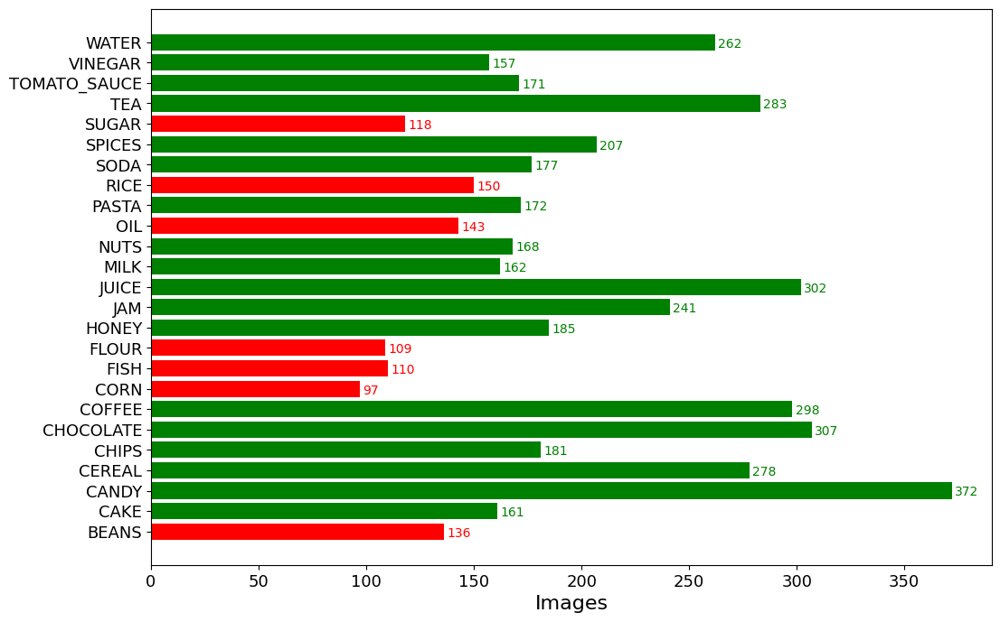

In [7]:
data = dict()

for i in os.listdir(original_img_dir):
    sub_dir = os.path.join(original_img_dir, i)
    count = len(os.listdir(sub_dir))
    data[i] = count


keys = data.keys()
values = list(data.values())

colors = ["red" if x <= 150 else "green" for x in values]

fig, ax = plt.subplots(figsize=(12, 8))
y_pos = np.arange(len(values))
plt.barh(y_pos, values, align="center", color=colors)
for i, v in enumerate(values):
    ax.text(v + 1.4, i - 0.25, str(v), color=colors[i])
ax.set_yticks(y_pos)
ax.set_yticklabels(keys)
ax.set_xlabel("Images", fontsize=16)
plt.xticks(color="black", fontsize=13)
plt.yticks(fontsize=13)
plt.show()

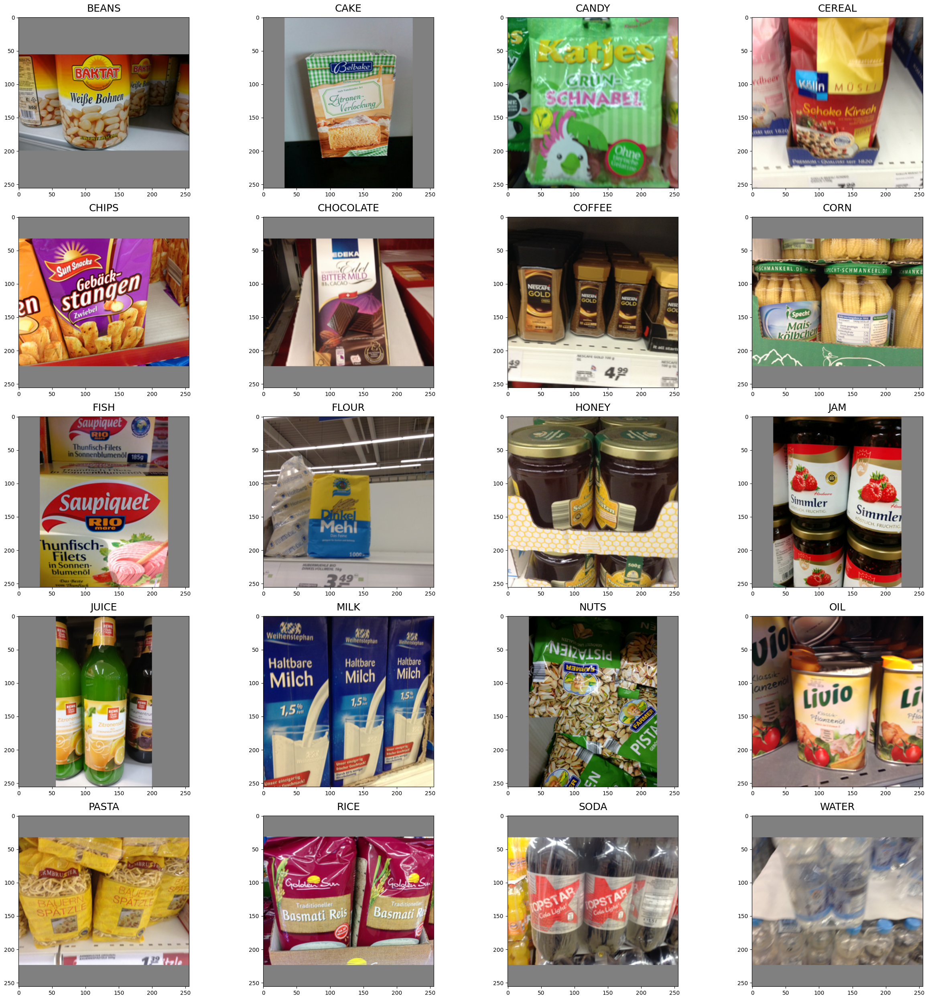

In [8]:
images = []

for food_folder in sorted(os.listdir(original_img_dir)):
    food_items = os.listdir(original_img_dir + "/" + food_folder)
    food_selected = np.random.choice(food_items)
    images.append(os.path.join(original_img_dir, food_folder, food_selected))

fig = plt.figure(1, figsize=(25, 25))

for subplot, image_ in enumerate(images):
    category = os.path.normpath(image_).split(os.sep)[-2]
    imgs = plt.imread(image_)
    a, b, c = imgs.shape
    fig = plt.subplot(5, 4, min(subplot + 1, 20))
    fig.set_title(category, pad=10, size=18)
    plt.imshow(imgs)

plt.tight_layout()

In [9]:
def split_original_dataset_into_train_test_and_validation_sets():
    if os.listdir(train_img_dir) or os.listdir(val_img_dir) or os.listdir(test_img_dir):
        print("Directories are not empty. Skipping split...")
        return

    os.makedirs(train_img_dir, exist_ok=True)
    os.makedirs(val_img_dir, exist_ok=True)
    os.makedirs(test_img_dir, exist_ok=True)

    subdirectories = [
        name for name in os.listdir(original_img_dir) if os.path.isdir(os.path.join(original_img_dir, name))
    ]

    for subdir in subdirectories:
        subdir_path = os.path.join(original_img_dir, subdir)
        train_subdir_path = os.path.join(train_img_dir, subdir)
        val_subdir_path = os.path.join(val_img_dir, subdir)
        test_subdir_path = os.path.join(test_img_dir, subdir)

        os.makedirs(train_subdir_path, exist_ok=True)
        os.makedirs(val_subdir_path, exist_ok=True)
        os.makedirs(test_subdir_path, exist_ok=True)

        all_image_filenames = [
            filename for filename in os.listdir(subdir_path) if filename.endswith(".jpg") or filename.endswith(".png")
        ]
        train_val_image_filenames, test_image_filenames = model_selection.train_test_split(
            all_image_filenames, test_size=0.2, random_state=42
        )
        train_image_filenames, val_image_filenames = model_selection.train_test_split(
            train_val_image_filenames, test_size=0.25, random_state=42
        )

        for filename in train_image_filenames:
            source_path = os.path.join(subdir_path, filename)
            target_path = os.path.join(train_subdir_path, filename)
            shutil.copy(source_path, target_path)

        for filename in val_image_filenames:
            source_path = os.path.join(subdir_path, filename)
            target_path = os.path.join(val_subdir_path, filename)
            shutil.copy(source_path, target_path)

        for filename in test_image_filenames:
            source_path = os.path.join(subdir_path, filename)
            target_path = os.path.join(test_subdir_path, filename)
            shutil.copy(source_path, target_path)


split_original_dataset_into_train_test_and_validation_sets()

Directories are not empty. Skipping split...


In [10]:
n_classes = 25
batch_size = 32
img_width, img_height = 256, 256

train_datagen = keras.preprocessing.image.ImageDataGenerator(
    rescale=1.0 / 255, shear_range=0.2, zoom_range=0.2, horizontal_flip=True
)

train_generator = train_datagen.flow_from_directory(
    train_img_dir, target_size=(img_height, img_width), batch_size=batch_size, class_mode="categorical"
)

val_datagen = keras.preprocessing.image.ImageDataGenerator(rescale=1.0 / 255)

val_generator = val_datagen.flow_from_directory(
    val_img_dir, target_size=(img_height, img_width), batch_size=batch_size, class_mode="categorical"
)

Found 2948 images belonging to 25 classes.
Found 997 images belonging to 25 classes.


In [11]:
class_map = train_generator.class_indices
class_map

{'BEANS': 0,
 'CAKE': 1,
 'CANDY': 2,
 'CEREAL': 3,
 'CHIPS': 4,
 'CHOCOLATE': 5,
 'COFFEE': 6,
 'CORN': 7,
 'FISH': 8,
 'FLOUR': 9,
 'HONEY': 10,
 'JAM': 11,
 'JUICE': 12,
 'MILK': 13,
 'NUTS': 14,
 'OIL': 15,
 'PASTA': 16,
 'RICE': 17,
 'SODA': 18,
 'SPICES': 19,
 'SUGAR': 20,
 'TEA': 21,
 'TOMATO_SAUCE': 22,
 'VINEGAR': 23,
 'WATER': 24}

In [12]:
def build_and_train_model(model_type: Literal["sequential", "functional"]):
    nb_train_samples = train_generator.n
    nb_validation_samples = val_generator.n

    inception = keras.applications.inception_v3.InceptionV3(weights="imagenet", include_top=False)

    compile_args = {
        "optimizer": keras.optimizers.SGD(lr=0.0001, momentum=0.9),
        "loss": "categorical_crossentropy",
        "metrics": ["accuracy"],
    }

    checkpointer = keras.callbacks.ModelCheckpoint(
        filepath="artifacts/checkpoints/checkpoint_inceptionV3", verbose=1, save_best_only=True
    )
    csv_logger = keras.callbacks.CSVLogger("artifacts/csv_logs/history_inceptionV3.log")

    fit_args = {
        "steps_per_epoch": nb_train_samples // batch_size,
        "validation_data": val_generator,
        "validation_steps": nb_validation_samples // batch_size,
        "epochs": 50,
        "verbose": 1,
        "callbacks": [csv_logger, checkpointer],
    }

    if model_type == "sequential":
        model = keras.models.Sequential(
            layers=[
                inception,
                keras.layers.GlobalAveragePooling2D(),
                keras.layers.Dense(128, activation="relu"),
                keras.layers.Dropout(0.2),
                keras.layers.Dense(n_classes, kernel_regularizer=keras.regularizers.l2(0.005), activation="softmax"),
            ]
        )
    else:
        x = inception.output
        x = keras.layers.GlobalAveragePooling2D()(x)
        x = keras.layers.Dense(128, activation="relu")(x)
        x = keras.layers.Dropout(0.2)(x)

        predictions = keras.layers.Dense(
            n_classes, kernel_regularizer=keras.regularizers.l2(0.005), activation="softmax"
        )(x)

        model = keras.models.Model(inputs=inception.input, outputs=predictions)

    model.compile(**compile_args)

    model.summary()

    history = model.fit(train_generator, **fit_args)

    return model, history


model, history = build_and_train_model("sequential")
# model, history = build_and_train_model("functional")

c:\Users\Computer\miniconda3\envs\ML-projekat\lib\site-packages\keras\optimizers\optimizer_v2\gradient_descent.py:111: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, None, None, 2048)  21802784  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 128)               262272    
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 25)                3225      
                                                                 
Total params: 22,068,281
Trainable params: 22,033,849
Non-trainable params: 34,432
_______________________________________

INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 39s 375ms/step - loss: 3.4958 - accuracy: 0.0412 - val_loss: 3.4058 - val_accuracy: 0.0736
Epoch 2/50
92/92 [==============================] - ETA: 0s - loss: 3.3557 - accuracy: 0.0898
Epoch 2: val_loss improved from 3.40581 to 3.29195, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 35s 373ms/step - loss: 3.3557 - accuracy: 0.0898 - val_loss: 3.2920 - val_accuracy: 0.1210
Epoch 3/50
92/92 [==============================] - ETA: 0s - loss: 3.2615 - accuracy: 0.1193
Epoch 3: val_loss improved from 3.29195 to 3.21214, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 36s 388ms/step - loss: 3.2615 - accuracy: 0.1193 - val_loss: 3.2121 - val_accuracy: 0.1542
Epoch 4/50
92/92 [==============================] - ETA: 0s - loss: 3.1832 - accuracy: 0.1629
Epoch 4: val_loss improved from 3.21214 to 3.13561, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 45s 486ms/step - loss: 3.1832 - accuracy: 0.1629 - val_loss: 3.1356 - val_accuracy: 0.2006
Epoch 5/50
92/92 [==============================] - ETA: 0s - loss: 3.0892 - accuracy: 0.1968
Epoch 5: val_loss improved from 3.13561 to 3.04886, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 49s 535ms/step - loss: 3.0892 - accuracy: 0.1968 - val_loss: 3.0489 - val_accuracy: 0.2429
Epoch 6/50
92/92 [==============================] - ETA: 0s - loss: 2.9844 - accuracy: 0.2445
Epoch 6: val_loss improved from 3.04886 to 2.95377, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 36s 394ms/step - loss: 2.9844 - accuracy: 0.2445 - val_loss: 2.9538 - val_accuracy: 0.2702
Epoch 7/50
92/92 [==============================] - ETA: 0s - loss: 2.8721 - accuracy: 0.2716
Epoch 7: val_loss improved from 2.95377 to 2.83851, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 36s 392ms/step - loss: 2.8721 - accuracy: 0.2716 - val_loss: 2.8385 - val_accuracy: 0.2964
Epoch 8/50
92/92 [==============================] - ETA: 0s - loss: 2.7647 - accuracy: 0.3035
Epoch 8: val_loss improved from 2.83851 to 2.72660, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 37s 403ms/step - loss: 2.7647 - accuracy: 0.3035 - val_loss: 2.7266 - val_accuracy: 0.3397
Epoch 9/50
92/92 [==============================] - ETA: 0s - loss: 2.6293 - accuracy: 0.3443
Epoch 9: val_loss improved from 2.72660 to 2.60293, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 37s 403ms/step - loss: 2.6293 - accuracy: 0.3443 - val_loss: 2.6029 - val_accuracy: 0.3700
Epoch 10/50
92/92 [==============================] - ETA: 0s - loss: 2.5078 - accuracy: 0.3663
Epoch 10: val_loss improved from 2.60293 to 2.49119, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 37s 403ms/step - loss: 2.5078 - accuracy: 0.3663 - val_loss: 2.4912 - val_accuracy: 0.3952
Epoch 11/50
92/92 [==============================] - ETA: 0s - loss: 2.4060 - accuracy: 0.4036
Epoch 11: val_loss improved from 2.49119 to 2.37429, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 37s 406ms/step - loss: 2.4060 - accuracy: 0.4036 - val_loss: 2.3743 - val_accuracy: 0.4274
Epoch 12/50
92/92 [==============================] - ETA: 0s - loss: 2.2899 - accuracy: 0.4331
Epoch 12: val_loss improved from 2.37429 to 2.27150, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 37s 404ms/step - loss: 2.2899 - accuracy: 0.4331 - val_loss: 2.2715 - val_accuracy: 0.4577
Epoch 13/50
92/92 [==============================] - ETA: 0s - loss: 2.1611 - accuracy: 0.4753
Epoch 13: val_loss improved from 2.27150 to 2.17145, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 37s 396ms/step - loss: 2.1611 - accuracy: 0.4753 - val_loss: 2.1714 - val_accuracy: 0.4839
Epoch 14/50
92/92 [==============================] - ETA: 0s - loss: 2.0841 - accuracy: 0.4952
Epoch 14: val_loss improved from 2.17145 to 2.07682, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 37s 404ms/step - loss: 2.0841 - accuracy: 0.4952 - val_loss: 2.0768 - val_accuracy: 0.5091
Epoch 15/50
92/92 [==============================] - ETA: 0s - loss: 1.9799 - accuracy: 0.5319
Epoch 15: val_loss improved from 2.07682 to 1.99185, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 37s 406ms/step - loss: 1.9799 - accuracy: 0.5319 - val_loss: 1.9919 - val_accuracy: 0.5302
Epoch 16/50
92/92 [==============================] - ETA: 0s - loss: 1.8813 - accuracy: 0.5494
Epoch 16: val_loss improved from 1.99185 to 1.91504, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 37s 403ms/step - loss: 1.8813 - accuracy: 0.5494 - val_loss: 1.9150 - val_accuracy: 0.5474
Epoch 17/50
92/92 [==============================] - ETA: 0s - loss: 1.8006 - accuracy: 0.5775
Epoch 17: val_loss improved from 1.91504 to 1.83689, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 37s 405ms/step - loss: 1.8006 - accuracy: 0.5775 - val_loss: 1.8369 - val_accuracy: 0.5716
Epoch 18/50
92/92 [==============================] - ETA: 0s - loss: 1.7116 - accuracy: 0.6067
Epoch 18: val_loss improved from 1.83689 to 1.77326, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 38s 408ms/step - loss: 1.7116 - accuracy: 0.6067 - val_loss: 1.7733 - val_accuracy: 0.5948
Epoch 19/50
92/92 [==============================] - ETA: 0s - loss: 1.6208 - accuracy: 0.6252
Epoch 19: val_loss improved from 1.77326 to 1.71546, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 38s 412ms/step - loss: 1.6208 - accuracy: 0.6252 - val_loss: 1.7155 - val_accuracy: 0.6038
Epoch 20/50
92/92 [==============================] - ETA: 0s - loss: 1.5693 - accuracy: 0.6423
Epoch 20: val_loss improved from 1.71546 to 1.66023, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 37s 404ms/step - loss: 1.5693 - accuracy: 0.6423 - val_loss: 1.6602 - val_accuracy: 0.6210
Epoch 21/50
92/92 [==============================] - ETA: 0s - loss: 1.4903 - accuracy: 0.6656
Epoch 21: val_loss improved from 1.66023 to 1.60560, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 37s 406ms/step - loss: 1.4903 - accuracy: 0.6656 - val_loss: 1.6056 - val_accuracy: 0.6361
Epoch 22/50
92/92 [==============================] - ETA: 0s - loss: 1.4348 - accuracy: 0.6835
Epoch 22: val_loss improved from 1.60560 to 1.55501, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 37s 405ms/step - loss: 1.4348 - accuracy: 0.6835 - val_loss: 1.5550 - val_accuracy: 0.6532
Epoch 23/50
92/92 [==============================] - ETA: 0s - loss: 1.3934 - accuracy: 0.6890
Epoch 23: val_loss improved from 1.55501 to 1.51587, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 38s 411ms/step - loss: 1.3934 - accuracy: 0.6890 - val_loss: 1.5159 - val_accuracy: 0.6613
Epoch 24/50
92/92 [==============================] - ETA: 0s - loss: 1.3125 - accuracy: 0.7239
Epoch 24: val_loss improved from 1.51587 to 1.47157, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 37s 404ms/step - loss: 1.3125 - accuracy: 0.7239 - val_loss: 1.4716 - val_accuracy: 0.6683
Epoch 25/50
92/92 [==============================] - ETA: 0s - loss: 1.2500 - accuracy: 0.7311
Epoch 25: val_loss improved from 1.47157 to 1.43092, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 37s 401ms/step - loss: 1.2500 - accuracy: 0.7311 - val_loss: 1.4309 - val_accuracy: 0.6724
Epoch 26/50
92/92 [==============================] - ETA: 0s - loss: 1.2208 - accuracy: 0.7462
Epoch 26: val_loss improved from 1.43092 to 1.39557, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 37s 401ms/step - loss: 1.2208 - accuracy: 0.7462 - val_loss: 1.3956 - val_accuracy: 0.6845
Epoch 27/50
92/92 [==============================] - ETA: 0s - loss: 1.1681 - accuracy: 0.7503
Epoch 27: val_loss improved from 1.39557 to 1.36595, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 37s 407ms/step - loss: 1.1681 - accuracy: 0.7503 - val_loss: 1.3659 - val_accuracy: 0.6835
Epoch 28/50
92/92 [==============================] - ETA: 0s - loss: 1.1347 - accuracy: 0.7668
Epoch 28: val_loss improved from 1.36595 to 1.33552, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 37s 404ms/step - loss: 1.1347 - accuracy: 0.7668 - val_loss: 1.3355 - val_accuracy: 0.6895
Epoch 29/50
92/92 [==============================] - ETA: 0s - loss: 1.1004 - accuracy: 0.7699
Epoch 29: val_loss improved from 1.33552 to 1.30624, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 37s 405ms/step - loss: 1.1004 - accuracy: 0.7699 - val_loss: 1.3062 - val_accuracy: 0.6935
Epoch 30/50
92/92 [==============================] - ETA: 0s - loss: 1.0614 - accuracy: 0.7840
Epoch 30: val_loss improved from 1.30624 to 1.29177, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 38s 411ms/step - loss: 1.0614 - accuracy: 0.7840 - val_loss: 1.2918 - val_accuracy: 0.6966
Epoch 31/50
92/92 [==============================] - ETA: 0s - loss: 1.0081 - accuracy: 0.8045
Epoch 31: val_loss improved from 1.29177 to 1.26695, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 38s 412ms/step - loss: 1.0081 - accuracy: 0.8045 - val_loss: 1.2670 - val_accuracy: 0.6976
Epoch 32/50
92/92 [==============================] - ETA: 0s - loss: 0.9751 - accuracy: 0.8086
Epoch 32: val_loss improved from 1.26695 to 1.24516, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 38s 416ms/step - loss: 0.9751 - accuracy: 0.8086 - val_loss: 1.2452 - val_accuracy: 0.7046
Epoch 33/50
92/92 [==============================] - ETA: 0s - loss: 0.9496 - accuracy: 0.8189
Epoch 33: val_loss improved from 1.24516 to 1.21707, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 38s 411ms/step - loss: 0.9496 - accuracy: 0.8189 - val_loss: 1.2171 - val_accuracy: 0.7107
Epoch 34/50
92/92 [==============================] - ETA: 0s - loss: 0.8936 - accuracy: 0.8361
Epoch 34: val_loss improved from 1.21707 to 1.20697, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 38s 408ms/step - loss: 0.8936 - accuracy: 0.8361 - val_loss: 1.2070 - val_accuracy: 0.7077
Epoch 35/50
92/92 [==============================] - ETA: 0s - loss: 0.8655 - accuracy: 0.8488
Epoch 35: val_loss improved from 1.20697 to 1.18670, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 38s 409ms/step - loss: 0.8655 - accuracy: 0.8488 - val_loss: 1.1867 - val_accuracy: 0.7137
Epoch 36/50
92/92 [==============================] - ETA: 0s - loss: 0.8435 - accuracy: 0.8433
Epoch 36: val_loss improved from 1.18670 to 1.17047, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 38s 413ms/step - loss: 0.8435 - accuracy: 0.8433 - val_loss: 1.1705 - val_accuracy: 0.7198
Epoch 37/50
92/92 [==============================] - ETA: 0s - loss: 0.8310 - accuracy: 0.8460
Epoch 37: val_loss improved from 1.17047 to 1.15232, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 38s 414ms/step - loss: 0.8310 - accuracy: 0.8460 - val_loss: 1.1523 - val_accuracy: 0.7278
Epoch 38/50
92/92 [==============================] - ETA: 0s - loss: 0.7909 - accuracy: 0.8618
Epoch 38: val_loss improved from 1.15232 to 1.14036, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 48s 520ms/step - loss: 0.7909 - accuracy: 0.8618 - val_loss: 1.1404 - val_accuracy: 0.7258
Epoch 39/50
92/92 [==============================] - ETA: 0s - loss: 0.7661 - accuracy: 0.8635
Epoch 39: val_loss improved from 1.14036 to 1.12756, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 41s 446ms/step - loss: 0.7661 - accuracy: 0.8635 - val_loss: 1.1276 - val_accuracy: 0.7298
Epoch 40/50
92/92 [==============================] - ETA: 0s - loss: 0.7399 - accuracy: 0.8741
Epoch 40: val_loss improved from 1.12756 to 1.11017, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 46s 504ms/step - loss: 0.7399 - accuracy: 0.8741 - val_loss: 1.1102 - val_accuracy: 0.7369
Epoch 41/50
92/92 [==============================] - ETA: 0s - loss: 0.7206 - accuracy: 0.8759
Epoch 41: val_loss improved from 1.11017 to 1.10158, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 38s 409ms/step - loss: 0.7206 - accuracy: 0.8759 - val_loss: 1.1016 - val_accuracy: 0.7298
Epoch 42/50
92/92 [==============================] - ETA: 0s - loss: 0.6947 - accuracy: 0.8885
Epoch 42: val_loss improved from 1.10158 to 1.08704, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 38s 414ms/step - loss: 0.6947 - accuracy: 0.8885 - val_loss: 1.0870 - val_accuracy: 0.7440
Epoch 43/50
92/92 [==============================] - ETA: 0s - loss: 0.6677 - accuracy: 0.8961
Epoch 43: val_loss improved from 1.08704 to 1.07463, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 37s 403ms/step - loss: 0.6677 - accuracy: 0.8961 - val_loss: 1.0746 - val_accuracy: 0.7409
Epoch 44/50
92/92 [==============================] - ETA: 0s - loss: 0.6632 - accuracy: 0.8944
Epoch 44: val_loss improved from 1.07463 to 1.06998, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 38s 415ms/step - loss: 0.6632 - accuracy: 0.8944 - val_loss: 1.0700 - val_accuracy: 0.7440
Epoch 45/50
92/92 [==============================] - ETA: 0s - loss: 0.6299 - accuracy: 0.9005
Epoch 45: val_loss improved from 1.06998 to 1.05030, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 53s 579ms/step - loss: 0.6299 - accuracy: 0.9005 - val_loss: 1.0503 - val_accuracy: 0.7470
Epoch 46/50
92/92 [==============================] - ETA: 0s - loss: 0.6238 - accuracy: 0.9112
Epoch 46: val_loss improved from 1.05030 to 1.04741, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 65s 706ms/step - loss: 0.6238 - accuracy: 0.9112 - val_loss: 1.0474 - val_accuracy: 0.7460
Epoch 47/50
92/92 [==============================] - ETA: 0s - loss: 0.5871 - accuracy: 0.9170
Epoch 47: val_loss improved from 1.04741 to 1.04228, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 66s 720ms/step - loss: 0.5871 - accuracy: 0.9170 - val_loss: 1.0423 - val_accuracy: 0.7510
Epoch 48/50
92/92 [==============================] - ETA: 0s - loss: 0.5804 - accuracy: 0.9225
Epoch 48: val_loss improved from 1.04228 to 1.03433, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 66s 713ms/step - loss: 0.5804 - accuracy: 0.9225 - val_loss: 1.0343 - val_accuracy: 0.7571
Epoch 49/50
92/92 [==============================] - ETA: 0s - loss: 0.5659 - accuracy: 0.9252
Epoch 49: val_loss improved from 1.03433 to 1.02449, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 37s 401ms/step - loss: 0.5659 - accuracy: 0.9252 - val_loss: 1.0245 - val_accuracy: 0.7601
Epoch 50/50
92/92 [==============================] - ETA: 0s - loss: 0.5410 - accuracy: 0.9324
Epoch 50: val_loss improved from 1.02449 to 1.02422, saving model to artifacts/checkpoints\checkpoint_inceptionV3


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


INFO:tensorflow:Assets written to: artifacts/checkpoints\checkpoint_inceptionV3\assets


92/92 [==============================] - 38s 414ms/step - loss: 0.5410 - accuracy: 0.9324 - val_loss: 1.0242 - val_accuracy: 0.7571


In [13]:
model.save(path_to_model)

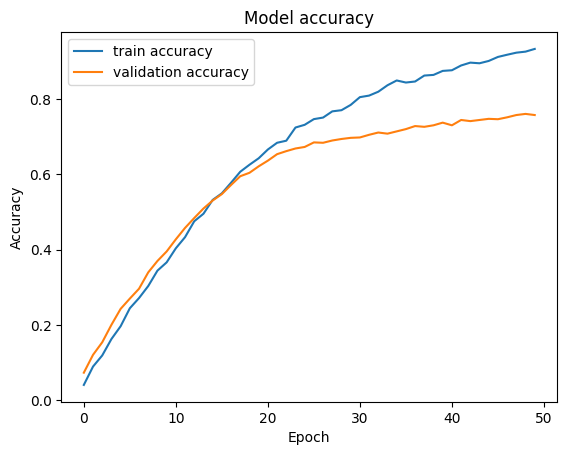

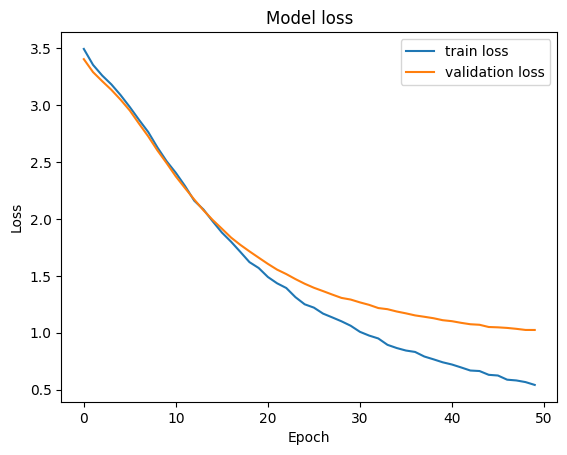

In [14]:
def plot_accuracy(history: keras.callbacks.History):
    plt.plot(history.history["accuracy"], label="train accuracy")
    plt.plot(history.history["val_accuracy"], label="validation accuracy")
    plt.title("Model accuracy")
    plt.ylabel("Accuracy")
    plt.xlabel("Epoch")
    plt.legend(loc="best")
    plt.savefig("artifacts/plots/Accuracy_InceptionV3")
    plt.show()


def plot_loss(history: keras.callbacks.History):
    plt.plot(history.history["loss"], label="train loss")
    plt.plot(history.history["val_loss"], label="validation loss")
    plt.title("Model loss")
    plt.ylabel("Loss")
    plt.xlabel("Epoch")
    plt.legend(loc="best")
    plt.savefig("artifacts/plots/Loss_InceptionV3")
    plt.show()


plot_accuracy(history)
plot_loss(history)

In [15]:
keras.backend.clear_session()
print("Loading the model..")
model = keras.models.load_model(path_to_model)

if model is not None:
    print("Model loaded!")
    model: keras.models.Model
else:
    raise ValueError("Failed to load the model from the specified path.")

Loading the model..
Model loaded!


In [16]:
test_datagen = keras.preprocessing.image.ImageDataGenerator(rescale=1.0 / 255)

test_generator = test_datagen.flow_from_directory(
    test_img_dir, target_size=(img_height, img_width), batch_size=batch_size, class_mode="categorical"
)

Found 1002 images belonging to 25 classes.


In [17]:
scores = model.evaluate_generator(test_generator)

print("Test Accuracy: {:.3f}".format(scores[1]))

C:\Users\Computer\AppData\Local\Temp\ipykernel_53232\430069557.py:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  scores = model.evaluate_generator(test_generator)


Test Accuracy: 0.758


In [18]:
categories = {v: k for k, v in class_map.items()}


def predict_image(filename: str, model: keras.models.Model):
    img_ = keras.preprocessing.image.load_img(filename, target_size=(256, 256))
    img_array = keras.preprocessing.image.img_to_array(img_)
    img_processed = np.expand_dims(img_array, axis=0)
    img_processed /= 255.0

    prediction = model.predict(img_processed)

    index = np.argmax(prediction)

    plt.title("Prediction - {}".format(categories[index]))
    plt.imshow(img_array)


def predict_dir(filedir: str, model: keras.models.Model):
    cols = 5
    pos = 0
    images = []
    total_images = len(os.listdir(filedir))
    rows = total_images // cols + 1

    true = os.path.normpath(filedir).split(os.sep)[-1]

    fig = plt.figure(1, figsize=(25, 25))

    for i in sorted(os.listdir(filedir)):
        images.append(os.path.join(filedir, i))

    for subplot, imggg in enumerate(images):
        img_ = keras.preprocessing.image.load_img(imggg, target_size=(299, 299))
        img_array = keras.preprocessing.image.img_to_array(img_)

        img_processed = np.expand_dims(img_array, axis=0)

        img_processed /= 255.0
        prediction = model.predict(img_processed)
        index = np.argmax(prediction).astype(int)

        pred = categories.get(index)
        if pred == true:
            pos += 1

        fig = plt.subplot(rows, cols, subplot + 1)
        fig.set_title(categories.get(index, ""), pad=10, size=18)
        plt.imshow(img_array)

    acc = pos / total_images
    print("Accuracy of Test : {:.2f} ({pos}/{total})".format(acc, pos=pos, total=total_images))
    plt.tight_layout()

1/1 [==============================] - 1s 627ms/step


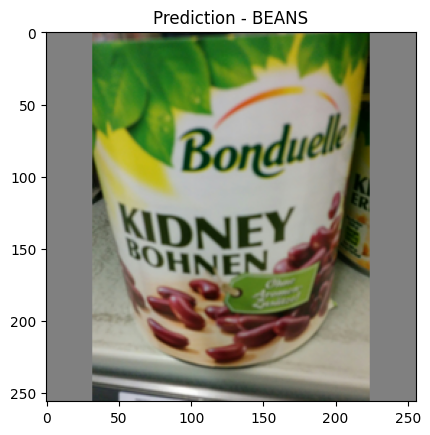

In [19]:
predict_image(f"{test_img_dir}/BEANS/BEANS0004.png", model)

1/1 [==============================] - 0s 16ms/step
Accuracy of Test : 0.64 (21/33)


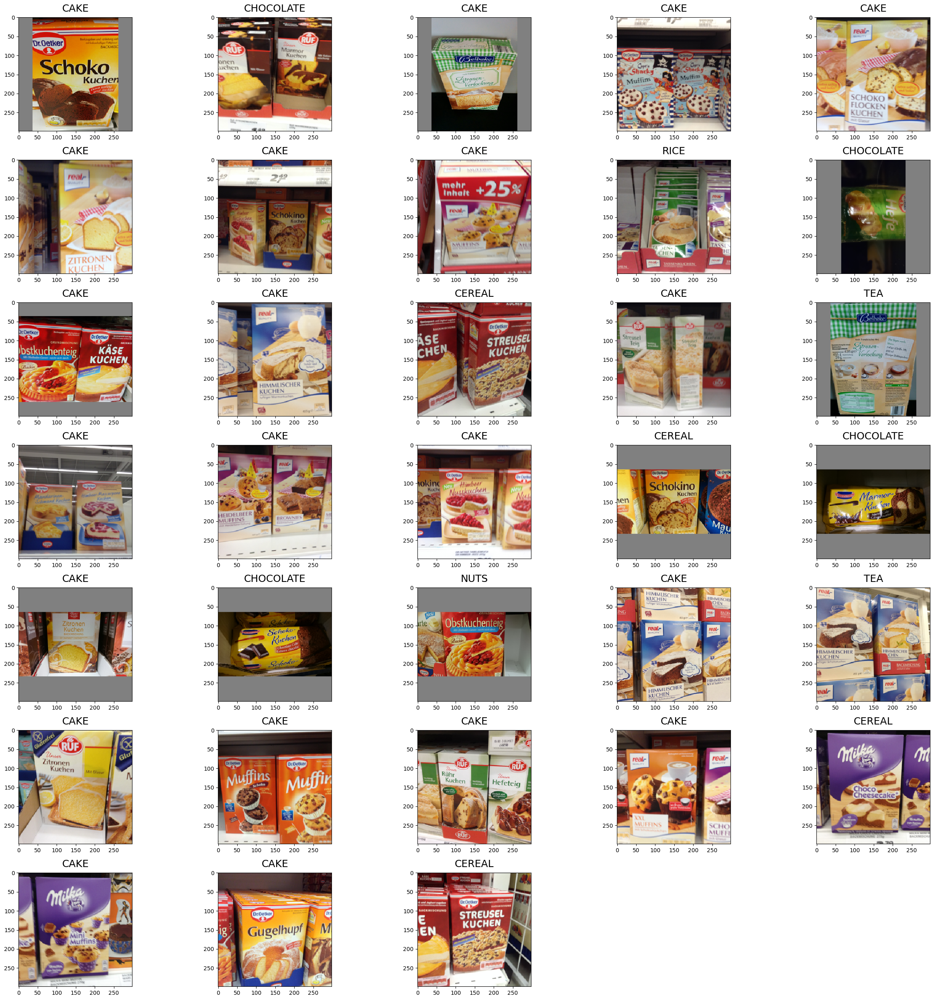

In [20]:
predict_dir(f"{test_img_dir}/CAKE", model)

In [21]:
img_width, img_height = 299, 299


def labels_confusion_matrix():
    mapping: dict[str, int] = {}
    for i, j in enumerate(sorted(os.listdir(test_img_dir))):
        mapping[j] = i

    real: list[int] = []
    predicted: list[int] = []

    for i in os.listdir(test_img_dir):
        true = os.path.join(test_img_dir, i)
        true = os.path.split(true)[-1]
        true = mapping[true]

        for j in os.listdir(os.path.join(test_img_dir, i)):
            img_ = keras.preprocessing.image.load_img(
                os.path.join(test_img_dir, i, j), target_size=(img_height, img_width)
            )
            img_array = keras.preprocessing.image.img_to_array(img_)
            img_processed = np.expand_dims(img_array, axis=0)
            img_processed /= 255.0
            prediction = model.predict(img_processed)
            index = np.argmax(prediction).astype(int)

            predicted.append(index)
            real.append(true)

    return (real, predicted)


def display_confusion_matrix(real: list[int], predicted: list[int]):
    cmap = "viridis"
    cm_plot_labels = [i for i in range(25)]

    cm = metrics.confusion_matrix(y_true=real, y_pred=predicted)
    df_cm = pd.DataFrame(cm, cm_plot_labels, cm_plot_labels)
    sns.set(font_scale=1.1)
    plt.figure(figsize=(15, 10))
    s = sns.heatmap(df_cm, annot=True, cmap=cmap)
    plt.ylabel("True label")
    plt.xlabel("Predicted label")
    plt.savefig("artifacts/metrics/confusion_matrix.png")
    plt.show()

1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 19ms/step


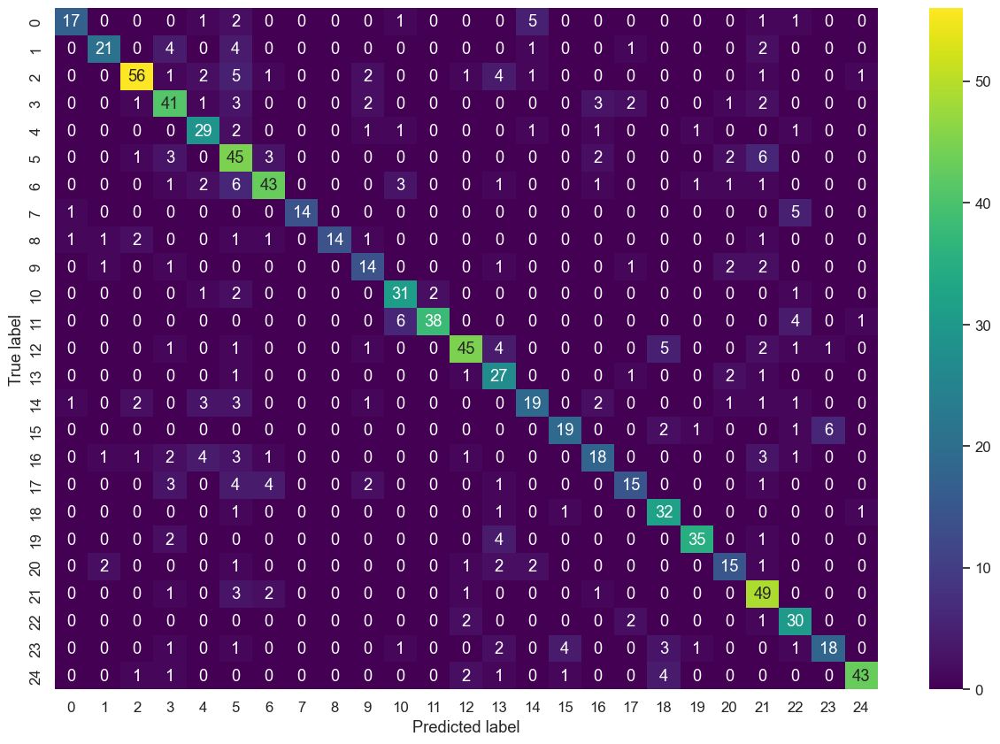

In [22]:
y_true, y_pred = labels_confusion_matrix()
display_confusion_matrix(y_true, y_pred)